In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
from glob import glob
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import pydicom
import skimage
from skimage import io
import matplotlib.pyplot as plt
from itertools import chain
from scipy.stats import mode

##Import any other packages you may need here

EDA is open-ended, and it is up to you to decide how to look at different ways to slice and dice your data. A good starting point is to look at the requirements for the FDA documentation in the final part of this project to guide (some) of the analyses you do. 

This EDA should also help to inform you of how pneumonia looks in the wild. E.g. what other types of diseases it's commonly found with, how often it is found, what ages it affects, etc. 

Note that this NIH dataset was not specifically acquired for pneumonia. So, while this is a representation of 'pneumonia in the wild,' the prevalence of pneumonia may be different if you were to take only chest x-rays that were acquired in an ER setting with suspicion of pneumonia. 

Perform the following EDA:
* The patient demographic data such as gender, age, patient position,etc. (as it is available)
* The x-ray views taken (i.e. view position)
* The number of cases including: 
    * number of pneumonia cases,
    * number of non-pneumonia cases
* The distribution of other diseases that are comorbid with pneumonia
* Number of disease per patient 
* Pixel-level assessments of the imaging data for healthy & disease states of interest (e.g. histograms of intensity values) and compare distributions across diseases.

Note: use full NIH data to perform the first a few EDA items and use `sample_labels.csv` for the pixel-level assassements. 

Also, **describe your findings and how will you set up the model training based on the findings.**

In [3]:
## Below is some helper code to read data for you.
## Load NIH data
all_xray_df = pd.read_csv('/data/Data_Entry_2017.csv')
all_xray_df.sample(3)

## Load 'sample_labels.csv' data for pixel level assessments
sample_df = pd.read_csv('sample_labels.csv')
sample_df.sample(3)

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImageWidth,OriginalImageHeight,OriginalImagePixelSpacing_x,OriginalImagePixelSpacing_y
372,00001974_011.png,Nodule,11,1974,051Y,F,PA,2992,2991,0.143,0.143
3399,00016778_017.png,Consolidation,17,16778,026Y,M,AP,3056,2544,0.139,0.139
2283,00011695_003.png,No Finding,3,11695,051Y,M,AP,2500,2048,0.168,0.168


In [4]:
## EDA
all_xray_df.head()

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y],Unnamed: 11
0,00000001_000.png,Cardiomegaly,0,1,58,M,PA,2682,2749,0.143,0.143,NaN
1,00000001_001.png,Cardiomegaly|Emphysema,1,1,58,M,PA,2894,2729,0.143,0.143,NaN
2,00000001_002.png,Cardiomegaly|Effusion,2,1,58,M,PA,2500,2048,0.168,0.168,NaN
3,00000002_000.png,No Finding,0,2,81,M,PA,2500,2048,0.171,0.171,NaN
4,00000003_000.png,Hernia,0,3,81,F,PA,2582,2991,0.143,0.143,NaN


########### Total number of patients ( Unique Patient ID).  There are 30805 unique patients in this dataset

In [5]:
print ( 'Total number of Patients in this dataset(Unique Patient ID) :{}'.format(all_xray_df['Patient ID'].nunique()))

Total number of Patients in this dataset(Unique Patient ID) :30805


EDA # 1 : " The patient demographic data such as gender, age, patient position,etc. (as it is available)"

Below is the patient age distribution.  We can see that highest concentraction of patient is in the age range: 50-60 

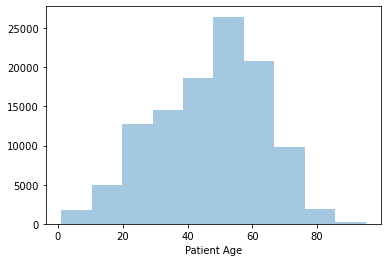

In [6]:
sns.distplot(all_xray_df['Patient Age'][all_xray_df['Patient Age'] <130],bins=10,kde=False)

EDA # 1 : " The patient demographic data such as gender, age, patient position,etc. (as it is available)"
Below is the patient gender distribution along with Xray view position

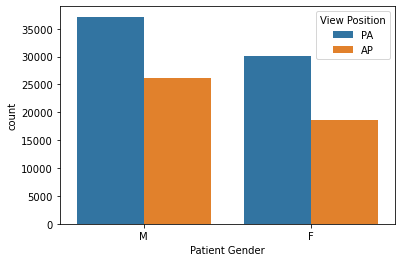

In [7]:
sns.countplot(x=all_xray_df['Patient Gender'],data=all_xray_df,hue=all_xray_df['View Position'])

In [8]:
# EDA 2 # "The x-ray views taken (i.e. view position)"

#Below is the patient Xray view position count ( along with Male/Female break-down) for this dataset

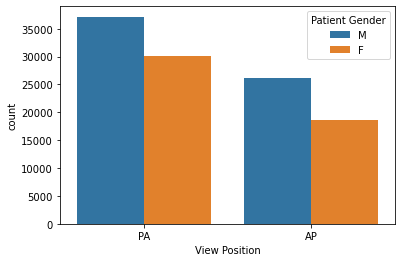

In [9]:
sns.countplot(x=all_xray_df['View Position'],data=all_xray_df,hue=all_xray_df['Patient Gender'])

#############  Create separate columns for each diseases for analysis. Split 'Finding Labels' column #############

In [10]:
df = all_xray_df['Finding Labels'].str.get_dummies(sep='|')

In [11]:
df1 = pd.concat([all_xray_df,df],1)

In [12]:
df1.head()

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,...,Emphysema,Fibrosis,Hernia,Infiltration,Mass,No Finding,Nodule,Pleural_Thickening,Pneumonia,Pneumothorax
0,00000001_000.png,Cardiomegaly,0,1,58,M,PA,2682,2749,0.143,...,0,0,0,0,0,0,0,0,0,0
1,00000001_001.png,Cardiomegaly|Emphysema,1,1,58,M,PA,2894,2729,0.143,...,1,0,0,0,0,0,0,0,0,0
2,00000001_002.png,Cardiomegaly|Effusion,2,1,58,M,PA,2500,2048,0.168,...,0,0,0,0,0,0,0,0,0,0
3,00000002_000.png,No Finding,0,2,81,M,PA,2500,2048,0.171,...,0,0,0,0,0,1,0,0,0,0
4,00000003_000.png,Hernia,0,3,81,F,PA,2582,2991,0.143,...,0,0,1,0,0,0,0,0,0,0


EDA # 4 :  The distribution of other diseases that are comorbid with pneumonia.  
Top 3 diseases (Comborbidities)

Pneumonia                                          322

Infiltration|Pneumonia                             199

Edema|Infiltration|Pneumonia                       137

Atelectasis|Pneumonia                              108

In [13]:
df2 = df1['Finding Labels'][df1['Pneumonia'] == 1].value_counts().iloc[0:30]

In [14]:
df2

Pneumonia                                          322
Infiltration|Pneumonia                             199
Edema|Infiltration|Pneumonia                       137
Atelectasis|Pneumonia                              108
Edema|Pneumonia                                     83
Effusion|Pneumonia                                  54
Effusion|Infiltration|Pneumonia                     42
Consolidation|Pneumonia                             36
Atelectasis|Infiltration|Pneumonia                  34
Atelectasis|Effusion|Pneumonia                      23
Edema|Effusion|Infiltration|Pneumonia               21
Edema|Effusion|Pneumonia                            19
Nodule|Pneumonia                                    19
Atelectasis|Effusion|Infiltration|Pneumonia         18
Atelectasis|Consolidation|Pneumonia                 15
Consolidation|Infiltration|Pneumonia                13
Infiltration|Nodule|Pneumonia                       11
Mass|Pneumonia                                      11
Pleural_Th

Plot the distribution of other diseases that are comorbid with Pneumonia

In [15]:
# Summarize data by Patient ID and calculate total disease count

In [16]:
s1 = df1.groupby(df1['Patient ID']).sum()

In [17]:
s1['Atelectasis'] = s1['Atelectasis'].apply(lambda x : 1 if x > 1 else x)
s1['Cardiomegaly'] = s1['Cardiomegaly'].apply(lambda x : 1 if x > 1 else x)
s1['Consolidation'] = s1['Consolidation'].apply(lambda x : 1 if x > 1 else x)
s1['Edema'] = s1['Edema'].apply(lambda x : 1 if x > 1 else x)
s1['Effusion'] = s1['Effusion'].apply(lambda x : 1 if x > 1 else x)
s1['Emphysema'] = s1['Emphysema'].apply(lambda x : 1 if x > 1 else x)
s1['Fibrosis'] = s1['Fibrosis'].apply(lambda x : 1 if x > 1 else x)
s1['Hernia'] = s1['Hernia'].apply(lambda x : 1 if x > 1 else x)
s1['Infiltration'] = s1['Infiltration'].apply(lambda x : 1 if x > 1 else x)
s1['Mass'] = s1['Mass'].apply(lambda x : 1 if x > 1 else x)
s1['No Finding'] = s1['No Finding'].apply(lambda x : 1 if x > 1 else x)
s1['Nodule'] = s1['Nodule'].apply(lambda x : 1 if x > 1 else x)
s1['Pleural_Thickening'] = s1['Pleural_Thickening'].apply(lambda x : 1 if x > 1 else x)
s1['Pneumonia'] = s1['Pneumonia'].apply(lambda x : 1 if x > 1 else x)
s1['Pneumothorax'] = s1['Pneumothorax'].apply(lambda x : 1 if x > 1 else x)

In [18]:
s1['Total Diseases Count'] = s1['Atelectasis'] + s1['Cardiomegaly'] + s1['Consolidation'] + s1['Edema'] + s1['Effusion'] + s1['Emphysema'] + s1['Fibrosis'] + s1['Hernia'] + s1['Infiltration'] + s1['Mass'] + s1['Nodule'] + s1['Pleural_Thickening'] + s1['Pneumonia'] + s1['Pneumothorax']


In [19]:
s1.head()

,Follow-up #,Patient ID,Patient Age,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y],Unnamed: 11,Atelectasis,Cardiomegaly,...,Fibrosis,Hernia,Infiltration,Mass,No Finding,Nodule,Pleural_Thickening,Pneumonia,Pneumothorax,Total Diseases Count
Patient ID,,,,,,,,,,,,,,,,,,,,,
1,3,3,174,8076,7526,0.454,0.454,0.0,0,1,...,0,0,0,0,0,0,0,0,0,3
2,0,2,81,2500,2048,0.171,0.171,0.0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,28,24,620,20588,21465,1.219,1.219,0.0,0,0,...,0,1,1,0,0,0,0,0,0,2
4,0,4,82,2500,2048,0.168,0.168,0.0,0,0,...,0,0,0,1,0,1,0,0,0,2
5,28,40,556,21098,21241,1.219,1.219,0.0,0,0,...,0,0,1,0,1,0,0,0,0,2


EDA # 3 
The number of cases including:
number of pneumonia cases,
number of non-pneumonia cases

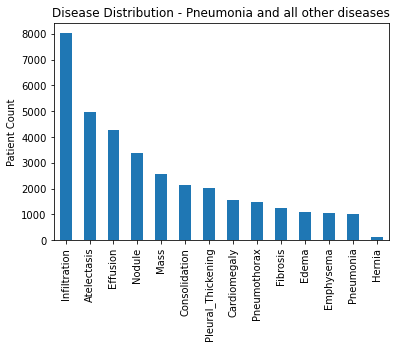

In [20]:
s1[['Atelectasis',
       'Cardiomegaly', 'Consolidation', 'Edema', 'Effusion', 'Emphysema',
       'Fibrosis', 'Hernia', 'Infiltration', 'Mass', 'Nodule',
       'Pleural_Thickening', 'Pneumonia', 'Pneumothorax']].sum().sort_values(ascending=False).plot(kind='bar')
plt.title('Disease Distribution - Pneumonia and all other diseases')
plt.ylabel('Patient Count')
plt.show()

EDA # 5  :  Number of disease per patient

Text(0.5, 1.0, ' Disease Occurrence / Patient Distribution')

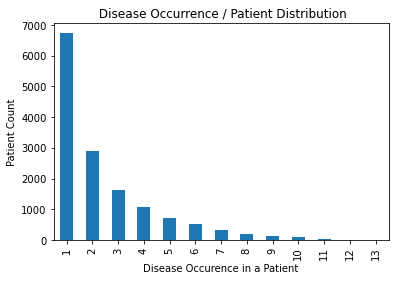

In [21]:
s1['Total Diseases Count'][s1['Total Diseases Count'] != 0].value_counts().plot(kind='bar')
plt.xlabel('Disease Occurence in a Patient')
plt.ylabel('Patient Count')
plt.title(' Disease Occurrence / Patient Distribution'  )

EDA #6 :  Review Pneumononia patient age distribution.  
As we can see below, Most of the Pneumonia patients are in the age group : 50-65

In [22]:
t1 = df1['Patient Age'][(df1['Pneumonia'] == 1) & (df1['Patient Age'] < 130)]

Text(0, 0.5, 'Patient Count')

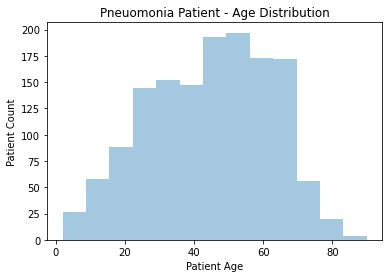

In [23]:
sns.distplot(t1,bins=13,kde=False)
plt.title('Pneuomonia Patient - Age Distribution')
plt.ylabel('Patient Count')

Below Vilon chart displays corelation among age, gender and view positions for Pneumononia patients. 
a. Age is almost uniformly distributed between male and Female.
b. X-ray view position is also uniformly distributed between Male & Female.
b. Age group : 55-65 seems to have highest number of Pneumonia cases for both male and female.

In [24]:
t2 =df1[(df1['Pneumonia'] == 1) & (df1['Patient Age'] < 130)]

Text(0.5, 1.0, 'Pneumonia Patients - Age,Gender and View position Distribution ')

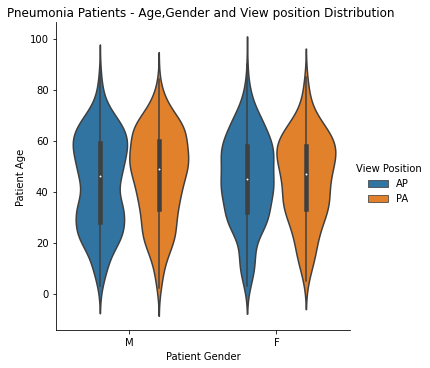

In [25]:
sns.catplot(y='Patient Age',x='Patient Gender',data=t2,kind='violin',hue='View Position')
plt.title('Pneumonia Patients - Age,Gender and View position Distribution ')

Text(0.5, 1.0, 'Pneumonia Patients - Age,Gender and View position Distribution ')

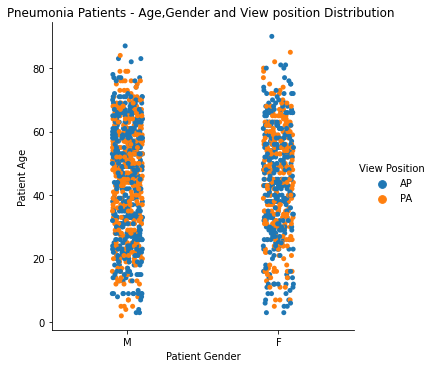

In [26]:
sns.catplot(y='Patient Age',x='Patient Gender',data=t2,kind='strip',hue='View Position')
plt.title('Pneumonia Patients - Age,Gender and View position Distribution ')

Text(0.5, 1.0, 'Pneumonia Patients - Age,Gender and View position Distribution ')

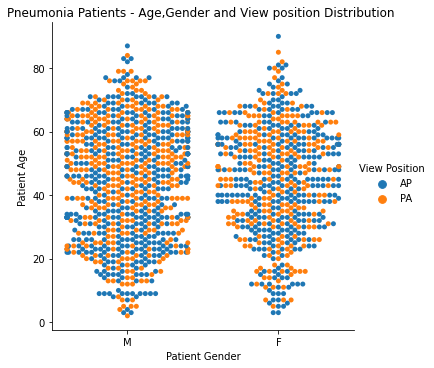

In [27]:
sns.catplot(y='Patient Age',x='Patient Gender',data=t2,kind='swarm', hue='View Position')
plt.title('Pneumonia Patients - Age,Gender and View position Distribution ')

Patient count with Pneumonia(1) and Non-Pneumonia disease(0)

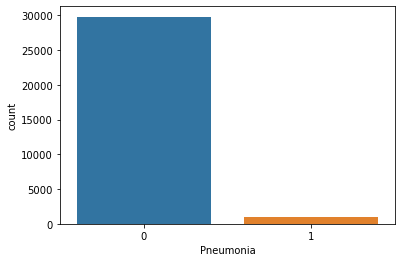

In [28]:
sns.countplot(x=(s1['Pneumonia']),data=s1)

Text(0.5, 1.0, 'Total number of Diseases - By Patient')

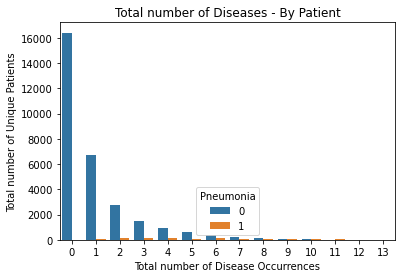

In [29]:
sns.countplot(x=s1['Total Diseases Count'],data=s1,orient="v",hue=s1['Pneumonia'])
plt.xlabel('Total number of Disease Occurrences')
plt.ylabel( 'Total number of Unique Patients')
plt.title ('Total number of Diseases - By Patient')

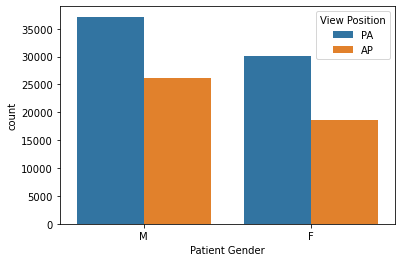

In [30]:
sns.countplot(x=all_xray_df['Patient Gender'],data=all_xray_df,hue=all_xray_df['View Position'])

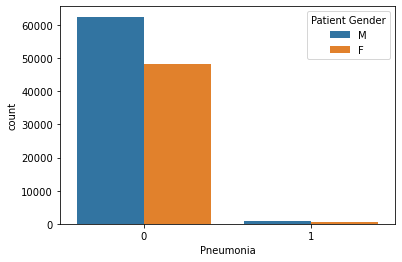

In [31]:
sns.countplot(x=df1['Pneumonia'], data=df1, hue=df1['Patient Gender'])

Text(0.5, 1.0, 'Male vs Female - Patient Cohort')

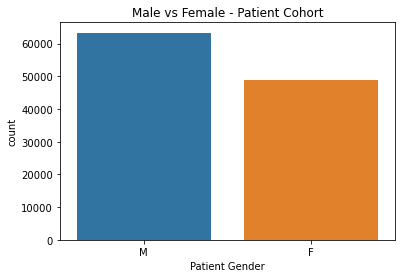

In [32]:
sns.countplot(x='Patient Gender',data=df1)
plt.title('Male vs Female - Patient Cohort')

In [33]:
############# : View Position Distribution ####################

Text(0.5, 1.0, 'Patient View Position - Cohort')

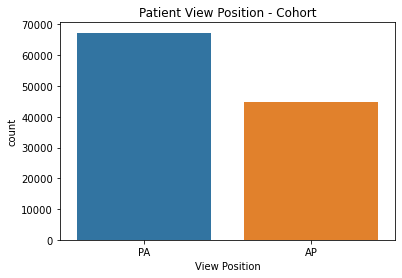

In [34]:
sns.countplot(x='View Position',data=df1)
plt.title('Patient View Position - Cohort')

In [35]:
########################### : Patient Age Distribution ###################

Text(0.5, 1.0, 'Patient Age Distribution')

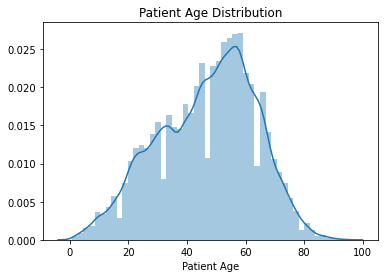

In [36]:
dx = all_xray_df[all_xray_df['Patient Age']<130] 
sns.distplot(dx['Patient Age'],kde='True')
plt.title('Patient Age Distribution')


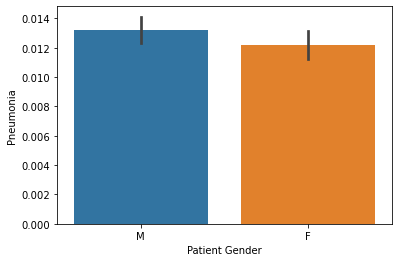

In [37]:
sns.barplot(x='Patient Gender',y='Pneumonia',data=df1)

Text(0.5, 1.0, 'Male and Female Distribution')

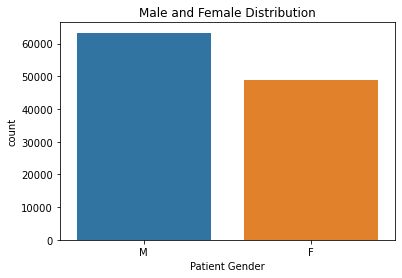

In [38]:
# plt.figure(figsize=(16,6))
sns.countplot(x='Patient Gender',data=all_xray_df)
plt.title('Male and Female Distribution')

In [ ]:
### EDA :  Image intensity analysis

In [39]:
sample_df = pd.read_csv('sample_labels.csv')
all_image_paths = {os.path.basename(x): x for x in 
                   glob(os.path.join('/data','images*', '*', '*.png'))}
print('Scans found:', len(all_image_paths), ', Total Headers', sample_df.shape[0])
sample_df['path'] = sample_df['Image Index'].map(all_image_paths.get)

Scans found: 112120 , Total Headers 5606


In [40]:
sample_df.head()

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImageWidth,OriginalImageHeight,OriginalImagePixelSpacing_x,OriginalImagePixelSpacing_y,path
0,00000013_005.png,Emphysema|Infiltration|Pleural_Thickening|Pneu...,5,13,060Y,M,AP,3056,2544,0.139,0.139,/data/images_001/images/00000013_005.png
1,00000013_026.png,Cardiomegaly|Emphysema,26,13,057Y,M,AP,2500,2048,0.168,0.168,/data/images_001/images/00000013_026.png
2,00000017_001.png,No Finding,1,17,077Y,M,AP,2500,2048,0.168,0.168,/data/images_001/images/00000017_001.png
3,00000030_001.png,Atelectasis,1,30,079Y,M,PA,2992,2991,0.143,0.143,/data/images_001/images/00000030_001.png
4,00000032_001.png,Cardiomegaly|Edema|Effusion,1,32,055Y,F,AP,2500,2048,0.168,0.168,/data/images_001/images/00000032_001.png


In [41]:
sample_df.columns

Index(['Image Index', 'Finding Labels', 'Follow-up #', 'Patient ID',
       'Patient Age', 'Patient Gender', 'View Position', 'OriginalImageWidth',
       'OriginalImageHeight', 'OriginalImagePixelSpacing_x',
       'OriginalImagePixelSpacing_y', 'path'],
      dtype='object')

In [42]:
all_labels = np.unique(list(chain(*all_xray_df['Finding Labels'].str.split('|').tolist())))


In [43]:
all_labels

array(['Atelectasis', 'Cardiomegaly', 'Consolidation', 'Edema',
       'Effusion', 'Emphysema', 'Fibrosis', 'Hernia', 'Infiltration',
       'Mass', 'No Finding', 'Nodule', 'Pleural_Thickening', 'Pneumonia',
       'Pneumothorax'], dtype='<U18')

In [44]:
# Create consolidated data frame with disease name and image path

s_Pneumonia = sample_df[['Finding Labels','path']][sample_df['Finding Labels'] =='Pneumonia'].head(3)
s_Atelectasis = sample_df[['Finding Labels','path']][sample_df['Finding Labels'] =='Atelectasis'].head(3)
s_Cardiomegaly = sample_df[['Finding Labels','path']][sample_df['Finding Labels'] =='Cardiomegaly'].head(3)
s_Consolidation = sample_df[['Finding Labels','path']][sample_df['Finding Labels'] =='Consolidation'].head(3)
s_Edema = sample_df[['Finding Labels','path']][sample_df['Finding Labels'] =='Edema'].head(3)
s_Effusion = sample_df[['Finding Labels','path']][sample_df['Finding Labels'] =='Effusion'].head(3)

s_Emphysema = sample_df[['Finding Labels','path']][sample_df['Finding Labels'] =='Emphysema'].head(3)
s_Fibrosis = sample_df[['Finding Labels','path']][sample_df['Finding Labels'] =='Fibrosis'].head(3)
s_Hernia = sample_df[['Finding Labels','path']][sample_df['Finding Labels'] =='Hernia'].head(3)
s_Infiltration = sample_df[['Finding Labels','path']][sample_df['Finding Labels'] =='Infiltration'].head(3)
s_Mass = sample_df[['Finding Labels','path']][sample_df['Finding Labels'] =='Mass'].head(3)
s_Nodule = sample_df[['Finding Labels','path']][sample_df['Finding Labels'] =='Nodule'].head(3)

s_Pleural_Thickening = sample_df[['Finding Labels','path']][sample_df['Finding Labels'] =='Pleural_Thickening'].head(3)
s_Pneumothorax = sample_df[['Finding Labels','path']][sample_df['Finding Labels'] =='Pneumothorax'].head(3)

s_combordities = sample_df[['Finding Labels','path']][sample_df['Finding Labels'].str.contains('Pneumonia')].head(20)


data = pd.concat((s_Pneumonia,s_Atelectasis,s_Cardiomegaly,s_Consolidation,s_Edema,s_Effusion,s_Emphysema,s_Fibrosis,s_Hernia,s_Infiltration,s_Mass,s_Nodule,s_Pleural_Thickening,s_Pneumothorax,s_combordities),axis=0)

In [45]:
data.head(10)


,Finding Labels,path
1631,Pneumonia,/data/images_004/images/00008470_008.png
2286,Pneumonia,/data/images_006/images/00011702_043.png
2422,Pneumonia,/data/images_006/images/00012158_025.png
3,Atelectasis,/data/images_001/images/00000030_001.png
29,Atelectasis,/data/images_001/images/00000175_001.png
30,Atelectasis,/data/images_001/images/00000175_002.png
226,Cardiomegaly,/data/images_001/images/00001249_010.png
255,Cardiomegaly,/data/images_002/images/00001373_009.png
257,Cardiomegaly,/data/images_002/images/00001373_021.png
20,Consolidation,/data/images_001/images/00000116_019.png


In [46]:
# Add additional columns and initialize intensity metrics
data['Image_mean'] = 0
data['Image_std'] = 0
data['Image_max_Intensity'] = 0
data['Image_min_Intensity'] = 0
data['Image_mod_Intensity'] = 0


In [47]:
data.head()

,Finding Labels,path,Image_mean,Image_std,Image_max_Intensity,Image_min_Intensity,Image_mod_Intensity
1631,Pneumonia,/data/images_004/images/00008470_008.png,0,0,0,0,0
2286,Pneumonia,/data/images_006/images/00011702_043.png,0,0,0,0,0
2422,Pneumonia,/data/images_006/images/00012158_025.png,0,0,0,0,0
3,Atelectasis,/data/images_001/images/00000030_001.png,0,0,0,0,0
29,Atelectasis,/data/images_001/images/00000175_001.png,0,0,0,0,0


In [48]:
data.columns

Index(['Finding Labels', 'path', 'Image_mean', 'Image_std',
       'Image_max_Intensity', 'Image_min_Intensity', 'Image_mod_Intensity'],
      dtype='object')

In [49]:
data.info

<bound method DataFrame.info of                      Finding Labels                                      path  \
1631                      Pneumonia  /data/images_004/images/00008470_008.png   
2286                      Pneumonia  /data/images_006/images/00011702_043.png   
2422                      Pneumonia  /data/images_006/images/00012158_025.png   
3                       Atelectasis  /data/images_001/images/00000030_001.png   
29                      Atelectasis  /data/images_001/images/00000175_001.png   
...                             ...                                       ...   
2035         Infiltration|Pneumonia  /data/images_005/images/00010552_005.png   
2148  Infiltration|Nodule|Pneumonia  /data/images_005/images/00011104_004.png   
2183         Infiltration|Pneumonia  /data/images_005/images/00011251_010.png   
2286                      Pneumonia  /data/images_006/images/00011702_043.png   
2422                      Pneumonia  /data/images_006/images/00012158_025.png

/opt/conda/lib/python3.7/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


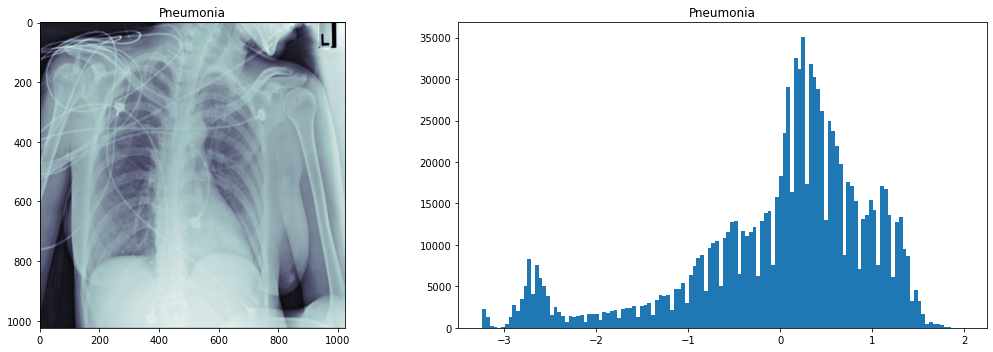

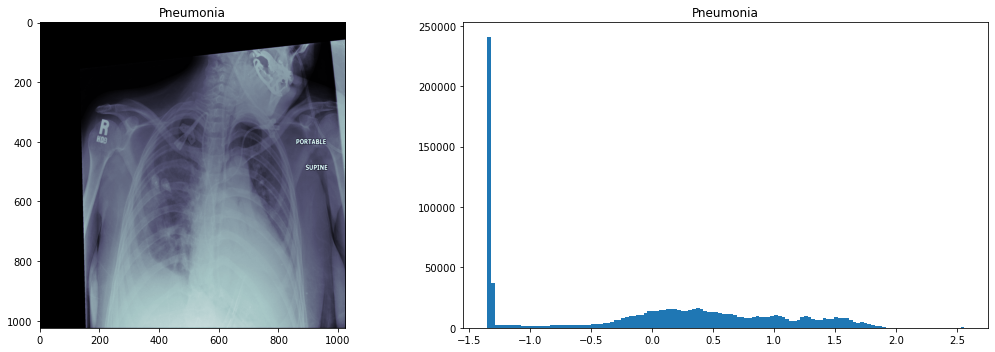

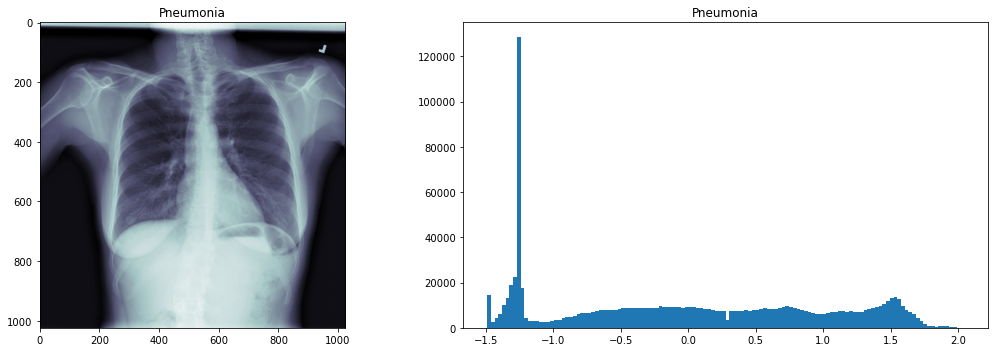

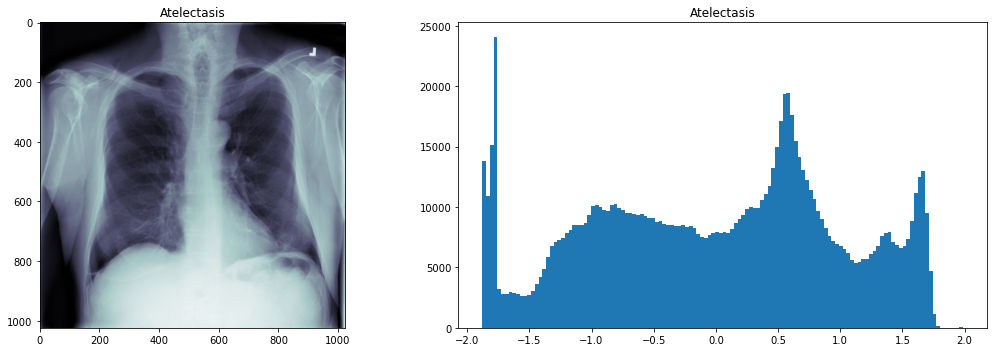

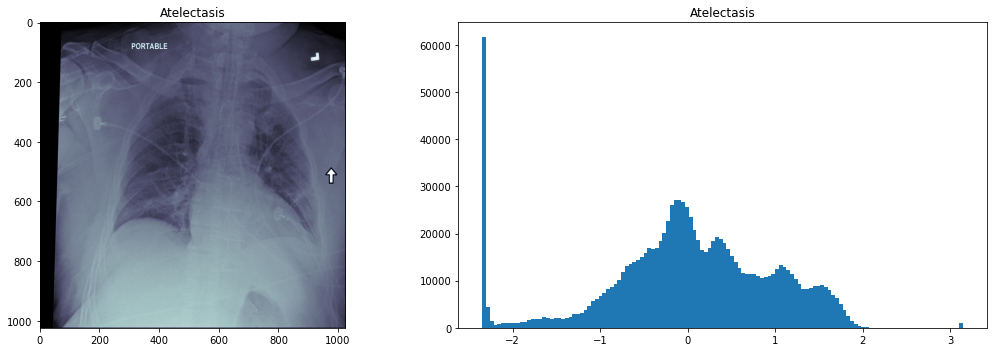

...

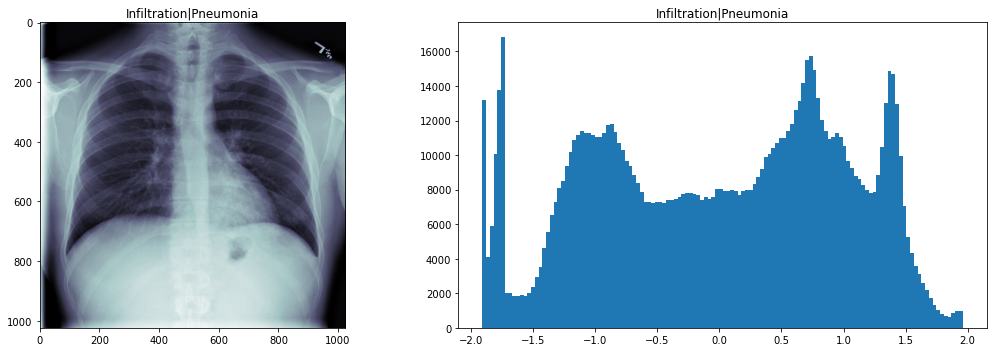

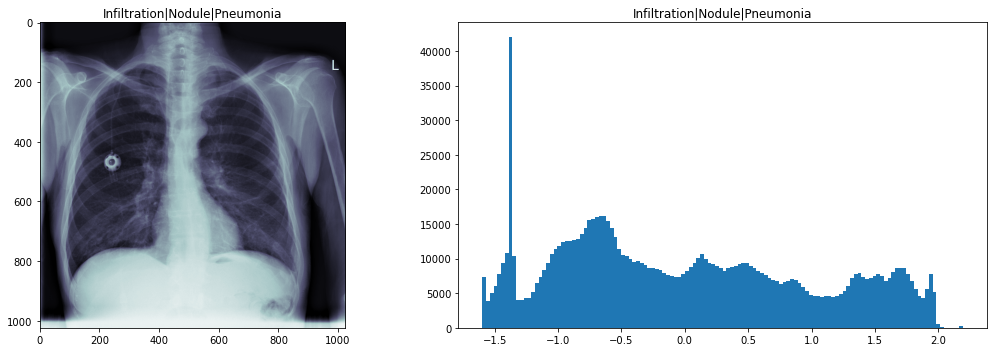

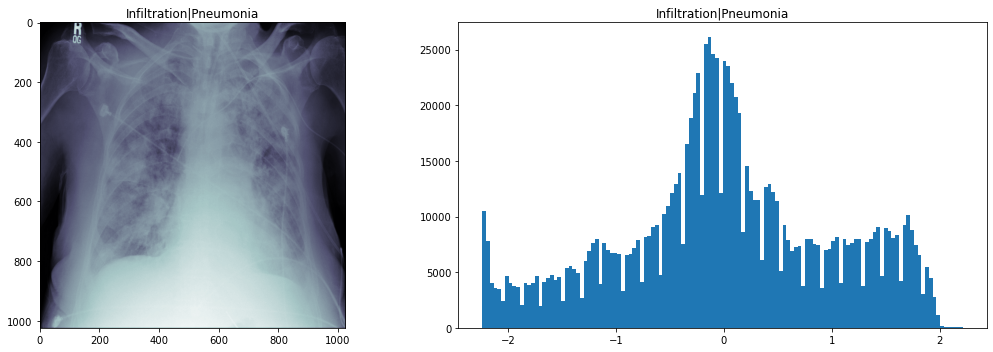

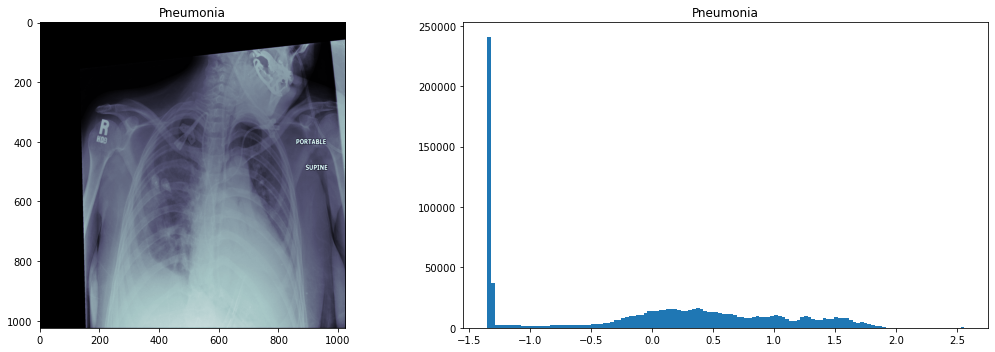

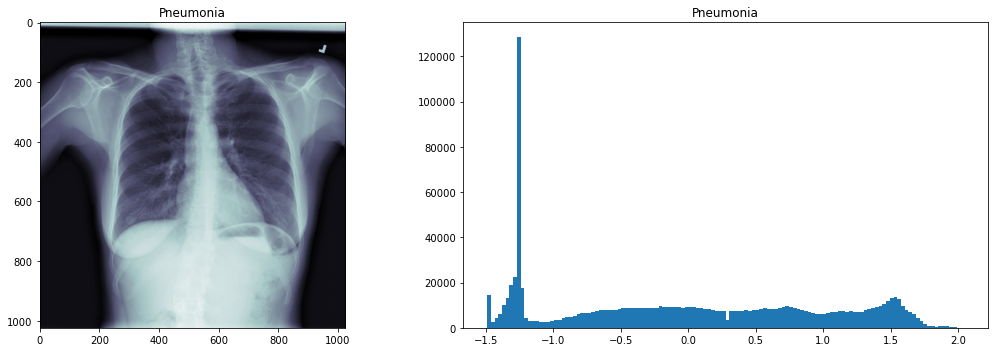

In [50]:
#  Plot Intensity histogram for images ( Pneumonia , all othe diseases and Combordities(Pneumonia plus other diseases)).
#  Total number intensity distribution plot for 62 images.
#  62 Intensity distribution plots
                   
for i in range(0,62):
    ## Visualize the image
    image = io.imread(data['path'].iloc[i])
    fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2,figsize =(15,5))
    ax1.imshow(image,cmap ='bone') 
    ax1.set_title(data['Finding Labels'].iloc[i])

    ## Intensity distribution
    mean_intensity = np.mean(image.ravel())
    std_intensity = np.std(image.ravel())  
    max_intensity = np.max(image.ravel())
    min_intensity = np.min(image.ravel())
    mod_intensity = mode(image.ravel())[0]

    
    data['Image_mean'].iloc[i] = mean_intensity
    data['Image_std'].iloc[i] = std_intensity
    data['Image_max_Intensity'].iloc[i] = max_intensity
    data['Image_min_Intensity'].iloc[i] = min_intensity
    data['Image_mod_Intensity'].iloc[i] = mod_intensity
    
     

    # fig = plt.figure()
    ax2.hist(((image -mean_intensity)/std_intensity).flatten(), bins = 128)
    ax2.set_title(data['Finding Labels'].iloc[i])
    plt.tight_layout()
    plt.show()

In [51]:
data.head()

,Finding Labels,path,Image_mean,Image_std,Image_max_Intensity,Image_min_Intensity,Image_mod_Intensity
1631,Pneumonia,/data/images_004/images/00008470_008.png,141.432756,43.705337,228,0,153
2286,Pneumonia,/data/images_006/images/00011702_043.png,88.196443,65.142422,255,0,0
2422,Pneumonia,/data/images_006/images/00012158_025.png,107.108478,71.773466,254,0,17
3,Atelectasis,/data/images_001/images/00000030_001.png,123.979362,66.035449,255,0,7
29,Atelectasis,/data/images_001/images/00000175_001.png,109.017986,46.470851,255,0,0


In [52]:
data.describe()

,Image_mean,Image_std,Image_max_Intensity,Image_min_Intensity,Image_mod_Intensity
count,62.000000,62.000000,62.000000,62.000000,62.000000
mean,135.209195,57.794438,249.000000,0.935484,82.354839
std,27.162530,10.868783,9.567705,2.969081,95.308145
min,86.486091,30.337384,214.000000,0.000000,0.000000
25%,113.757760,49.959382,246.000000,0.000000,0.000000
50%,128.734081,58.617898,255.000000,0.000000,12.500000
75%,162.131309,66.856177,255.000000,0.000000,180.250000
max,191.813338,75.223885,255.000000,16.000000,255.000000


In [ ]:
# Maximum intensity ranges between 225 -256 pixel for all images ( Pneumonia or Non-Pneumonia)

Text(0.5, 1.0, 'Disease vs Image Maximum Intensity - Strip plot')

<Figure size 3600x720 with 0 Axes>

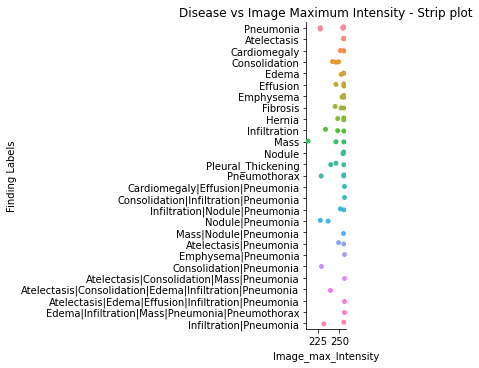

In [138]:
plt.figure(figsize=(50,10))
sns.catplot(x='Image_max_Intensity',y='Finding Labels',data=data,kind='strip')
plt.title('Disease vs Image Maximum Intensity - Strip plot')

Text(0.5, 1.0, 'Disease vs Image Mod Intensity - Strip plot')

<Figure size 3600x720 with 0 Axes>

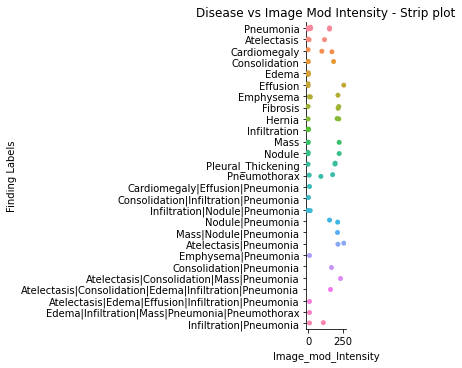

In [143]:
plt.figure(figsize=(50,10))
sns.catplot(x='Image_mod_Intensity',y='Finding Labels',data=data,kind='strip')
plt.title('Disease vs Image Mod Intensity - Strip plot')

Text(0.5, 1.0, 'Disease vs Image Mod Intensity - Swarm plot')

<Figure size 3600x720 with 0 Axes>

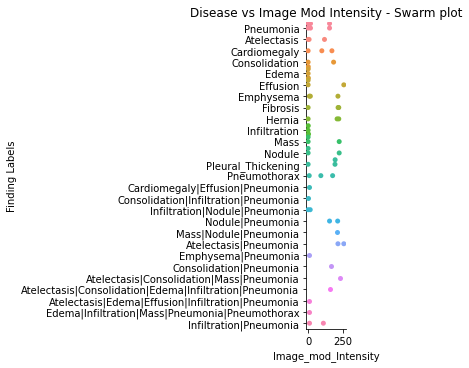

In [146]:
plt.figure(figsize=(50,10))
sns.catplot(x='Image_mod_Intensity',y='Finding Labels',data=data,kind='swarm')
plt.title('Disease vs Image Mod Intensity - Swarm plot')

Text(0.5, 1.0, 'Disease vs Image Mean - Strip plot')

<Figure size 3600x720 with 0 Axes>

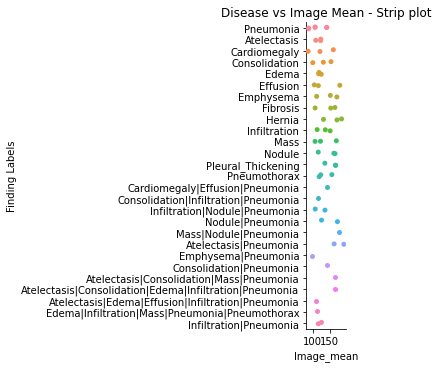

In [139]:
plt.figure(figsize=(50,10))
sns.catplot(x='Image_mean',y='Finding Labels',data=data,kind='strip')
plt.title('Disease vs Image Mean - Strip plot')

Text(0.5, 1.0, 'Disease vs Image Maximum Intensity - Swarm plot')

<Figure size 2160x1080 with 0 Axes>

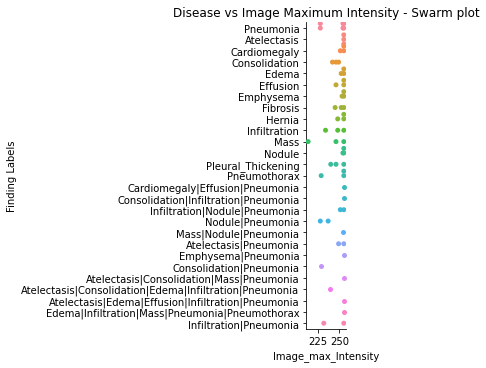

In [140]:
plt.figure(figsize=(30,15))
sns.catplot(x='Image_max_Intensity',y='Finding Labels',data=data,kind='swarm')
plt.title('Disease vs Image Maximum Intensity - Swarm plot')

Text(0.5, 1.0, 'Disease vs Image Maximum Intensity - bar plot')

<Figure size 2160x1080 with 0 Axes>

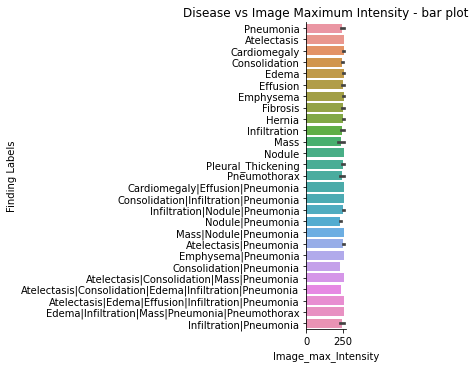

In [141]:
plt.figure(figsize=(30,15))
sns.catplot(x='Image_max_Intensity',y='Finding Labels',data=data,kind='bar')
plt.title('Disease vs Image Maximum Intensity - bar plot')

In [76]:
data1 = pd.pivot_table(data=data,index='Finding Labels', columns='Image_max_Intensity' ,values='Image_mod_Intensity')

Text(0.5, 1.0, 'Disease vs Image Max Intensity vs Image Mod Intensity -  Heat Map')

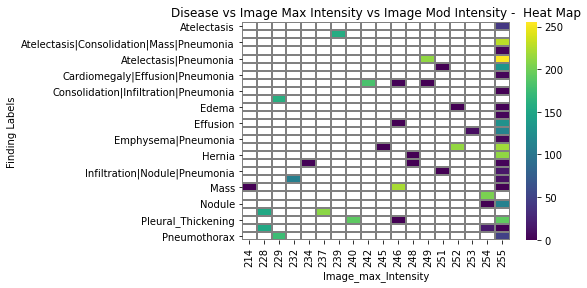

In [70]:
sns.heatmap(data1,linewidths=1,linecolor='gray',cmap='viridis')
plt.title('Disease vs Image Max Intensity vs Image Mod Intensity -  Heat Map')

In [53]:
data2 = pd.pivot_table(data=data,index='Finding Labels', columns='Image_mod_Intensity' ,values='Image_max_Intensity')

Text(0.5, 1.0, 'Disease vs Image Mod Intensity Image Max Intensity -  Heat Map')

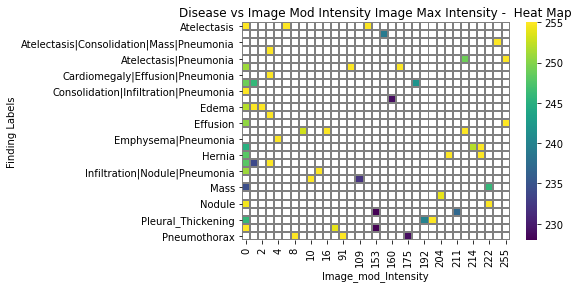

In [67]:
sns.heatmap(data2,linewidths=1,linecolor='gray',cmap='viridis')
plt.title('Disease vs Image Mod Intensity Image Max Intensity -  Heat Map')

Text(0.5, 1.0, 'Disease vs Image mean Intensity Image std Intensity -  Heat Map')

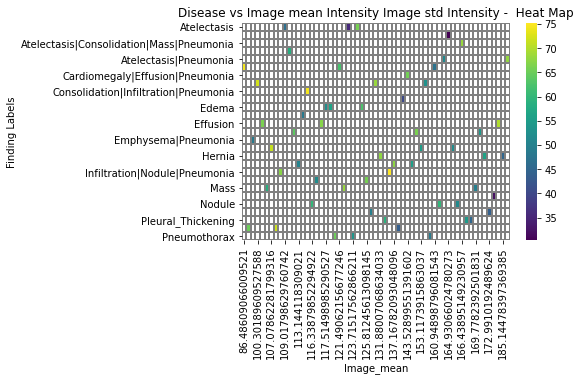

In [80]:
   
data3 = pd.pivot_table(data=data,index='Finding Labels', columns='Image_mean',values='Image_std')
sns.heatmap(data3,linewidths=1,linecolor='gray',cmap='viridis')
plt.title('Disease vs Image mean Intensity Image std Intensity -  Heat Map')

In [ ]:
# ------------------
# Key Findings 
#-------------------
# 1.  Patient Age is normally distributed.  There are outliers in patient age.  We can see some patients with age over 150.
# 2.  Data is highly imbalanced for Pneumonia. As part of training and test data setup, we need to create 50:50 Pneumonia cases
#     and for validation set, we should keep Pneumonia vs Non-Pneuomonia cases as 20:80
# 3.  Below are 3 top comborbidities
#     Top 3 diseases (Comborbidities)
#       Pneumonia 322
#       Infiltration|Pneumonia 199
#       Edema|Infiltration|Pneumonia 137
#       Atelectasis|Pneumonia 108
# 4. There are more Male Pneuomonia patients as compated to Female.
# 5. Infiltration, Atelectasis,Effusion,Nodule, Mass are top 5 diseases in this dataset.
# 6. Hernia patient count is lowest in this dataset
# 7. Pneumonia patient is second lowest in this dataset
# 8. Age group : 55-65 seems to have highest number of Pneumonia cases for both male and female
# 9. Total number of patients ( Unique Patient ID). There are 30805 unique patients in this dataset
# 10.Most of the Xray are taken in PA.  PA view positions are more compared to AP position
# 11. All diseases have maximum intensity in the range : 225-256
# 12. Pneumonia with Atelectasis and Effusion both have mod intensity as 255 for image dataset used in EDA.
# 13. Mass and Nodule both have mod intensity as 222
# 14. Atelectasis|Pneumonia and Effusion both have mod intensity as 255. This is also their max intensity as well.